In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from netCDF4 import Dataset, num2date
import os
import random
import copy
import csv
import pandas as pd
from ViT_Unpatch import ViT

# --------------------
# General Setup
# --------------------

deBug = True
seed_num = 1
np.random.seed(seed_num)
random.seed(seed_num)
torch.manual_seed(seed_num)
torch.cuda.manual_seed_all(seed_num)
torch.cuda.is_available()
device = torch.device("cpu" if not torch.cuda.is_available() else "cuda")
model_leadTms = "FullField2NoCV"
lead_time_width = 2

# --------------------
# Data Directories
# --------------------
mdl_directory = "/gpfs/gibbs/project/lu_lu/ax59/MJO_Project/Data/AllLeadTms/"
mdl_out_dir = "Result_01/"
obs_directory = "/gpfs/gibbs/project/lu_lu/ax59/MJO_Project/Data/AllLeadTms/"
obs_out_dir = "Result_02/"
bcor_directory = "Result_03/"
time_dir = "Data/Time/"

# --------------------
# Section 0: Class and Helper Function Definitions
# --------------------

class MDLDataset(torch.utils.data.Dataset):
    def __init__(self, mdl_dir, time_dir, lead_time):
        print("Loading MDL dataset and processing independent runs...")
        self.width = lead_time
        
        # Load Data
        variable_names = ["TMQ", "FLUT", "U200", "U850", "TREFHT"]
        time_objects = None
        lead_time_vars = []
        
        for i, var_name in enumerate(variable_names):
            file_path = os.path.join(mdl_dir, f"CML2025_Step0C_TROP30_MDL_remapped_90x180_daily_DJFM_Anom_nonFltr_{var_name}_leadTm1.nc")
            with Dataset(file_path) as f:
                lead_time_vars.append(f.variables[var_name][:])
                if i == 0:
                    time_var = f.variables['time']
                    time_objects = num2date(time_var[:], units=time_var.units, calendar=time_var.calendar)
                    
        all_features_raw = np.stack(lead_time_vars, axis=1)
        self.times = time_objects 
        print(f"MDL raw data loaded. {len(all_features_raw)} total entries.")

        # Boundaries of each run
        run_boundaries = np.where(self.times[1:] < self.times[:-1])[0]
        
        # Create a list of start/end indices for each run
        run_chunks_indices = []
        start_idx = 0
        for boundary_idx in run_boundaries:
            end_idx = boundary_idx + 1 # The chunk includes this index
            run_chunks_indices.append((start_idx, end_idx))
            start_idx = end_idx # The next chunk starts after the boundary
        run_chunks_indices.append((start_idx, len(all_features_raw))) # Add the last run
        
        print(f"Found {len(run_chunks_indices)} independent runs in the file.")

        # Process runs individually
        self.valid_pairs = []
        for run_start, run_end in run_chunks_indices:
            run_features = all_features_raw[run_start:run_end]
            run_times = self.times[run_start:run_end]

            # Find gaps
            chunk_start_idx_seasonal = 0
            if len(run_times) < 2: continue # Skip if the run is too short

            seasonal_gaps = np.where((run_times[1:] - run_times[:-1]).astype('timedelta64[D]').astype(int) > 1)[0]
            
            chunk_end_indices_seasonal = list(seasonal_gaps)
            chunk_end_indices_seasonal.append(len(run_times) - 1)

            for gap_idx_seasonal in chunk_end_indices_seasonal:
                chunk_end_slice = gap_idx_seasonal + 1
                
                season_features = run_features[chunk_start_idx_seasonal:chunk_end_slice]
                season_times = run_times[chunk_start_idx_seasonal:chunk_end_slice]
                
                # Create input-target pairs
                num_in_season = len(season_features)
                for i in range(num_in_season - self.width): # feature_time, target_time for debugging
                    feature = season_features[i]
                    target = season_features[i + self.width]
                    feature_time = season_times[i]
                    target_time = season_times[i + self.width]
                    self.valid_pairs.append((feature, target, feature_time, target_time))
                
                chunk_start_idx_seasonal = gap_idx_seasonal + 1

        print(f"MDL dataset fully processed. Found {len(self.valid_pairs)} valid input-target pairs across all runs.")

    def __len__(self):
        return len(self.valid_pairs)

    def __getitem__(self, idx):
        feature, target, feature_time, target_time = self.valid_pairs[idx]
        
        return (
            torch.tensor(feature, dtype=torch.float32),
            torch.tensor(target, dtype=torch.float32),
        )

class OBSDataset(torch.utils.data.Dataset):
    def __init__(self, obs_dir, time_dir, lead_time, indices=None):
        print("Loading OBS dataset and processing seasonal chunks...")
        self.width = lead_time

        # Load Data
        variable_names = ["tcwv", "olr", "u200", "u850", "trefht"]
        time_objects = None
        lead_time_vars = []
        
        for i, var_name in enumerate(variable_names):
            file_path = os.path.join(obs_dir, f"CML2025_Step0C_TROP30_OBS_remapped_90x180_daily_DJFM_Anom_nonFltr_{var_name}_leadTm1.nc")
            with Dataset(file_path) as f:
                lead_time_vars.append(f.variables[var_name][:])
                if i == 0:
                    time_var = f.variables['time']
                    time_objects = num2date(time_var[:], units=time_var.units, calendar=time_var.calendar)
        
        all_features_full = np.stack(lead_time_vars, axis=1)
        all_times_full = time_objects

        # Subset indices
        if indices is not None:
            all_features = all_features_full[indices]
            self.times = all_times_full[indices] 
            print(f"OBS dataset subset applied. Processing {len(all_features)} time steps for this fold.")
        else:
            all_features = all_features_full
            self.times = all_times_full
            print(f"OBS dataset loaded. Processing {len(all_features)} time steps.")

        # Find gaps
        self.valid_pairs = []
        chunk_start_idx = 0
        
        if len(self.times) == 0:
            print("Warning: No data to process (empty indices). Dataset will be empty.")
            return

        gaps = np.where((self.times[1:] - self.times[:-1]).astype('timedelta64[D]').astype(int) > 1)[0]

        for gap_idx in np.append(gaps, len(self.times) - 1):
            chunk_end_idx = gap_idx + 1
            
            chunk_features = all_features[chunk_start_idx:chunk_end_idx]
            chunk_times = self.times[chunk_start_idx:chunk_end_idx]
            
            # Create input-target pairs
            num_in_chunk = len(chunk_features)
            for i in range(num_in_chunk - self.width): # feature_time, target_time for debugging
                feature = chunk_features[i]
                target = chunk_features[i + self.width]
                feature_time = chunk_times[i]
                target_time = chunk_times[i + self.width]
                self.valid_pairs.append((feature, target, feature_time, target_time))
            
            chunk_start_idx = chunk_end_idx
            
        print(f"OBS dataset processed. Found {len(self.valid_pairs)} valid input-target pairs.")

    def __len__(self):
        return len(self.valid_pairs)

    def __getitem__(self, idx):
        feature, target, feature_time, target_time = self.valid_pairs[idx]
        
        return (
            torch.tensor(feature, dtype=torch.float32),
            torch.tensor(target, dtype=torch.float32),
        )

class FNOOBSDataset(torch.utils.data.Dataset):
    def __init__(self, obs_dir, time_dir, lead_time, indices=None):
        print("Loading OBS dataset and processing seasonal chunks...")
        self.width = lead_time

        # Load Data
        variable_names = ["tcwv", "olr", "u200", "u850", "trefht"]
        time_objects = None
        lead_time_vars = []
        
        for i, var_name in enumerate(variable_names):
            file_path = os.path.join(obs_dir, f"CML2025_Step0C_TROP30_OBS_remapped_90x180_daily_DJFM_Anom_nonFltr_{var_name}_leadTm1.nc")
            with Dataset(file_path) as f:
                lead_time_vars.append(f.variables[var_name][:])
                if i == 0:
                    time_var = f.variables['time']
                    time_objects = num2date(time_var[:], units=time_var.units, calendar=time_var.calendar)
        
        all_features_full = np.stack(lead_time_vars, axis=1)
        all_times_full = time_objects

        # Subset indices
        if indices is not None:
            all_features = all_features_full[indices]
            self.times = all_times_full[indices] 
            print(f"OBS dataset subset applied. Processing {len(all_features)} time steps for this fold.")
        else:
            all_features = all_features_full
            self.times = all_times_full
            print(f"OBS dataset loaded. Processing {len(all_features)} time steps.")

        # Find gaps
        self.valid_pairs = []
        chunk_start_idx = 0
        
        if len(self.times) == 0:
            print("Warning: No data to process (empty indices). Dataset will be empty.")
            return

        gaps = np.where((self.times[1:] - self.times[:-1]).astype('timedelta64[D]').astype(int) > 1)[0]

        for gap_idx in np.append(gaps, len(self.times) - 1):
            chunk_end_idx = gap_idx + 1
            
            chunk_features = all_features[chunk_start_idx:chunk_end_idx]
            chunk_times = self.times[chunk_start_idx:chunk_end_idx]
            
            # Create input-target pairs
            num_in_chunk = len(chunk_features)
            for i in range(num_in_chunk - self.width): # feature_time, target_time for debugging
                feature = chunk_features[i]
                target = chunk_features[i + self.width]
                feature_time = chunk_times[i]
                target_time = chunk_times[i + self.width]
                self.valid_pairs.append((feature, target, feature_time, target_time))
            
            chunk_start_idx = chunk_end_idx
            
        print(f"OBS dataset processed. Found {len(self.valid_pairs)} valid input-target pairs.")

    def __len__(self):
        return len(self.valid_pairs)

    def __getitem__(self, idx):
        feature, target, feature_time, target_time = self.valid_pairs[idx]
        
        return (
            torch.tensor(feature, dtype=torch.float32).permute(1, 2, 0),
            torch.tensor(target, dtype=torch.float32).permute(1, 2, 0),
        )


In [2]:
# Helper Functions for Visualization
import torch
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_single_model_comparison(
    model: torch.nn.Module,
    dataset: torch.utils.data.Dataset,
    sample_idx: int,
    FNO: bool = False, # Processing FNO or not
    save_path: str = None, # Optional save path
    title: str = None
):  
    # --- Hardcoded Parameters ---
    DEVICE = device
    LEAD_TIME_WIDTH = 2
    VARIABLE_NAMES = ["TMQ", "FLUT", "U200", "U850", "TREFHT"]
    
    # 1. Get a single data sample
    input_image, target_image = dataset[sample_idx]

    # 2. Make prediction
    model.eval()
    with torch.no_grad():
        # Add batch dimension and move to device for prediction
        input_tensor = input_image.unsqueeze(0).to(DEVICE)
        predicted_tensor = model(input_tensor)
        # Remove batch dimension and move back to CPU for plotting
        predicted_image = predicted_tensor.squeeze(0).cpu()

    # 3. Prepare data for plotting
    target_np = target_image.numpy()
    predicted_np = predicted_image.numpy()
    input_np = input_image.numpy()

    if FNO:
        target_np = np.transpose(target_np, (2, 0, 1))
        predicted_np = np.transpose(predicted_np, (2, 0, 1))
        input_np = np.transpose(input_np, (2, 0, 1))
    
    error_np = predicted_np - target_np
    
    # 4. Plotting setup
    
    # Create a 5x4 grid
    fig, axes = plt.subplots(len(VARIABLE_NAMES), 4, figsize=(20, 15), constrained_layout=True)
    
    if title is None:
        title = f'Model Prediction and Error for Sample #{sample_idx} (Lead Time: {LEAD_TIME_WIDTH} days)'
        
    fig.suptitle(title, fontsize=16)

    global_max_abs_error = np.max(np.abs(error_np))
    column_titles = ["Input Image", "Ground Truth", "Model Prediction", "Error (Pred - Truth)"]

    for i in range(len(VARIABLE_NAMES)): # Loop through the channels (5 variables)
        
        # Determine a common color scale for the physical fields (Input, Target, Prediction)
        vmin = min(input_np[i].min(), target_np[i].min(), predicted_np[i].min())
        vmax = max(input_np[i].max(), target_np[i].max(), predicted_np[i].max())
        
        # Column 0: Input Image
        axes[i, 0].imshow(input_np[i], cmap='jet', vmin=vmin, vmax=vmax)
        axes[i, 0].set_ylabel(VARIABLE_NAMES[i], fontsize=12, fontweight='bold')
        
        # Column 1: Ground Truth
        axes[i, 1].imshow(target_np[i], cmap='jet', vmin=vmin, vmax=vmax)

        # Column 2: Model Prediction
        im_pred = axes[i, 2].imshow(predicted_np[i], cmap='jet', vmin=vmin, vmax=vmax)
        fig.colorbar(im_pred, ax=axes[i, :3].tolist(), orientation='vertical', fraction=0.05, pad=0.04)
        
        # Column 3: Model Error
        im_err = axes[i, 3].imshow(error_np[i], cmap='jet', vmin=-global_max_abs_error, vmax=global_max_abs_error)
        fig.colorbar(im_err, ax=axes[i, 3])

    # Set titles for the column layout
    for j, col_title in enumerate(column_titles):
        axes[0, j].set_title(col_title, fontsize=14)

    # Remove ticks for clarity
    for ax in axes.flat:
        ax.set_xticks([])
        ax.set_yticks([])

    # 5. Conditional Saving
    if save_path:
        plt.savefig(save_path)
        print(f"Plot saved to: {save_path}")
        
    plt.show()

def plot_loss(mdl_1, obs_1, mdl_2=None, obs_2=None, compare_models=False):

    def load_data(path):
        if path is None: return None, None
        with np.load(path) as data:
            return data['train_loss'][1:], data['test_loss'][1:]

    m1_tr, m1_te = load_data(mdl_1)
    o1_tr, o1_te = load_data(obs_1)

    epochs = np.arange(len(m1_tr))

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    if compare_models:
        if mdl_2 is None or obs_2 is None:
            raise ValueError("To use compare_models=True, you must provide mdl_2 and obs_2.")

        m2_tr, m2_te = load_data(mdl_2)
        o2_tr, o2_te = load_data(obs_2)
        
        titles = ['Pretraining Comparison (MDL)', 'Fine-tuning Comparison (OBS)']
        
        groups = [
            (m1_tr, m1_te, "MDL 1", m2_tr, m2_te, "MDL 2"),
            (o1_tr, o1_te, "OBS 1", o2_tr, o2_te, "OBS 2")
        ]

        for ax, (tr1, te1, name1, tr2, te2, name2), title in zip(axes, groups, titles):
            ax.plot(epochs, te1, label=f'{name1} Val', color='tab:blue', linestyle='-')
            ax.plot(epochs, tr1, label=f'{name1} Train', color='tab:blue', linestyle='--', alpha=0.5)
            
            ax.plot(epochs, te2, label=f'{name2} Val', color='tab:orange', linestyle='-')
            ax.plot(epochs, tr2, label=f'{name2} Train', color='tab:orange', linestyle='--', alpha=0.5)
            
            ax.legend()
            ax.set_title(title, fontsize=14)

    else:
        titles = ['Pretraining Model Loss (MDL 1)', 'Fine-tuning Model Loss (OBS 1)']
        
        groups = [
            (m1_tr, m1_te),
            (o1_tr, o1_te)
        ]
        
        for ax, (train, test), title in zip(axes, groups, titles):
            ax.plot(epochs, train, label='Training Loss')
            ax.plot(epochs, test, label='Validation Loss')
            
            ax.legend(loc='upper right')
            ax.set_title(title, fontsize=14)

    # --- COMMON STYLING ---
    for ax in axes:
        ax.set_xlabel('Epoch')
        ax.set_ylabel('Loss Value')
        ax.grid(True, linestyle=':', alpha=0.6)

    plt.tight_layout()
    plt.show()

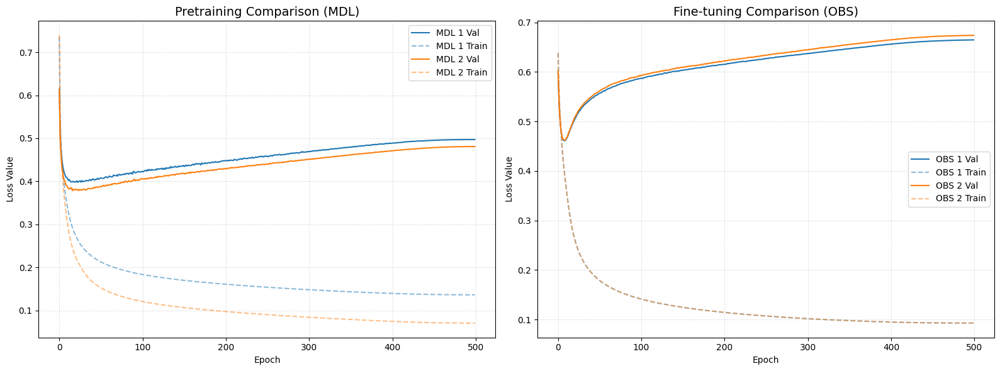

In [10]:
plot_loss("Result_01/ViTTIMJO_FiLM_Andrew_MDL_leadTmFullField2SmallNoCV_loss.npz",
          "Result_02/ViTTIMJO_FiLM_Andrew_OBS_leadTmFullField2SmallNoCV_loss.npz",
          "Result_01/ViTTIMJO_FiLM_Andrew_MDL_leadTmFullField2NoCVLast_loss.npz", 
          "Result_02/ViTTIMJO_FiLM_Andrew_OBS_leadTmFullField2NoCVLast_loss.npz", 
          True)

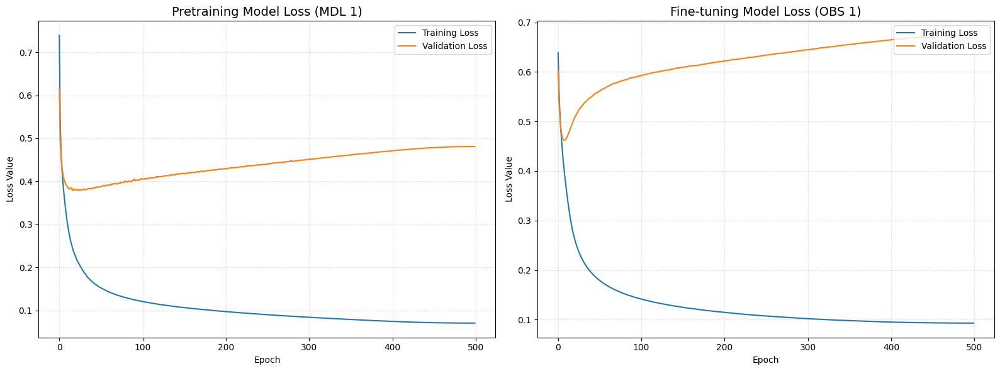

In [7]:
plot_loss("Result_01/ViTTIMJO_FiLM_Andrew_MDL_leadTmFullField2NoCV_loss.npz",
          "Result_02/ViTTIMJO_FiLM_Andrew_OBS_leadTmFullField2NoCV_loss.npz")

In [6]:
import pandas as pd
from netCDF4 import Dataset, num2date
import numpy as np
import os
import sys

# --- 1. Define File Path ---
# We only need to check one file, since the time dim is assumed to be the same
mdl_dir = "/gpfs/gibbs/project/lu_lu/ax59/MJO_Project/Data/AllLeadTms/"
var_name = "TMQ" # Let's check the file you get time from
file_path = os.path.join(mdl_dir, f"CML2025_Step0C_TROP30_MDL_remapped_90x180_daily_DJFM_Anom_nonFltr_{var_name}_leadTm1.nc")

print(f"Loading time data from: {file_path}")

# --- 2. Load Raw Time Data ---
with Dataset(file_path) as f:
    if 'time' not in f.variables:
        print(f"Error: 'time' variable not found in file.", file=sys.stderr)
    else:
        time_var = f.variables['time']
        time_values = time_var[:]
        time_units = time_var.units
        time_calendar = time_var.calendar
        
        # Convert to datetime objects
        raw_datetime_objects = num2date(time_values, units=time_units, calendar=time_calendar)
        print(f"\nSuccessfully loaded {len(raw_datetime_objects)} total time entries.")

        # --- 3. Analyze Duplicates with Pandas ---
        # This is the most powerful way to see what's going on
        time_series = pd.Series(raw_datetime_objects)
        
        print("\n--- Analyzing Date Frequencies ---")
        date_counts = time_series.value_counts()
        
        print(f"Total entries:     {len(time_series)}")
        print(f"Unique dates:      {len(date_counts)}")
        print(f"Duplicate entries: {len(time_series) - len(date_counts)}")
        
        if len(date_counts) > 0:
            print("\nTop 10 most common dates found:")
            print(date_counts.head(10))

        # --- 4. Look at the Raw, Unsorted Order ---
        print("\n--- First 50 Entries (Raw Order from File) ---")
        for i in range(min(50, len(raw_datetime_objects))):
            print(f"Index {i}: {raw_datetime_objects[i].strftime('%Y-%m-%d')}")

Loading time data from: /gpfs/gibbs/project/lu_lu/ax59/MJO_Project/Data/AllLeadTms/CML2025_Step0C_TROP30_MDL_remapped_90x180_daily_DJFM_Anom_nonFltr_TMQ_leadTm1.nc

Successfully loaded 43076 total time entries.

--- Analyzing Date Frequencies ---
Total entries:     43076
Unique dates:      13189
Duplicate entries: 29887

Top 10 most common dates found:
0001-11-30 00:00:00    8
0001-12-01 00:00:00    8
0001-12-02 00:00:00    8
0001-12-03 00:00:00    8
0001-12-04 00:00:00    8
0001-12-05 00:00:00    8
0001-12-06 00:00:00    8
0001-12-07 00:00:00    8
0001-12-08 00:00:00    8
0001-12-09 00:00:00    8
Name: count, dtype: int64

--- First 50 Entries (Raw Order from File) ---
Index 0: 0001-11-30
Index 1: 0001-12-01
Index 2: 0001-12-02
Index 3: 0001-12-03
Index 4: 0001-12-04
Index 5: 0001-12-05
Index 6: 0001-12-06
Index 7: 0001-12-07
Index 8: 0001-12-08
Index 9: 0001-12-09
Index 10: 0001-12-10
Index 11: 0001-12-11
Index 12: 0001-12-12
Index 13: 0001-12-13
Index 14: 0001-12-14
Index 15: 0001-1

Loading OBS dataset and processing seasonal chunks...
OBS dataset loaded. Processing 5092 time steps.
OBS dataset processed. Found 5008 valid input-target pairs.
Total OBS samples across all lead times: 5008


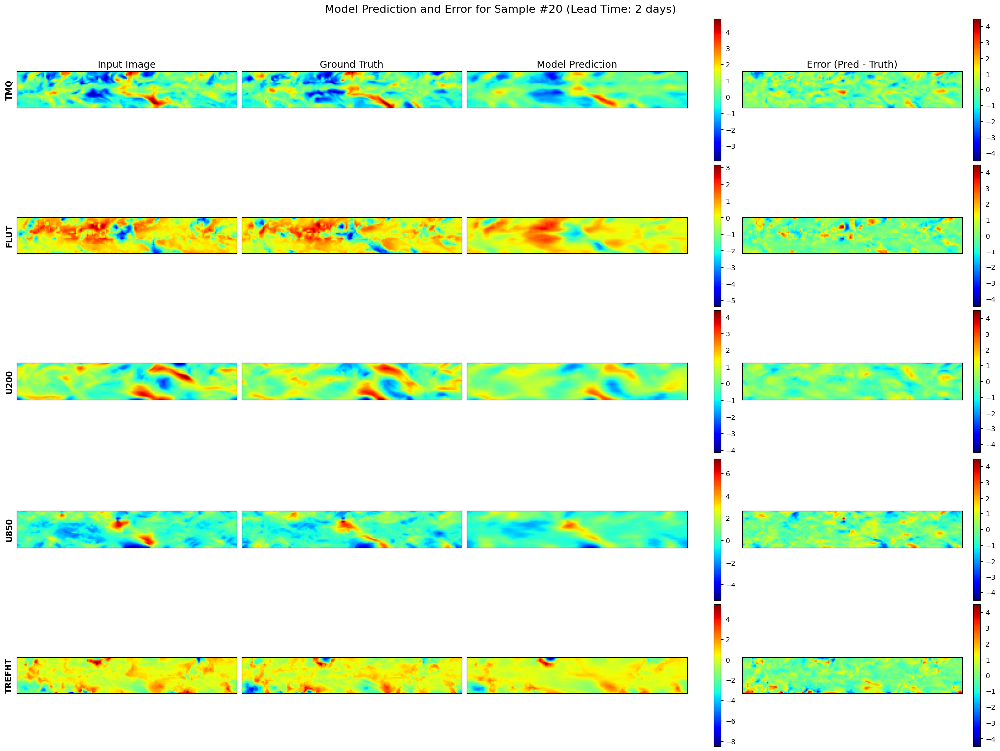

In [71]:
obs_dataset = FNOOBSDataset(obs_dir=obs_directory, time_dir=time_dir, lead_time=lead_time_width)

train_test_split = 0.95
total_samples = len(obs_dataset)
print(f"Total OBS samples across all lead times: {total_samples}")

obs_train_dataset, obs_test_dataset = torch.utils.data.random_split(obs_dataset, [int(train_test_split * total_samples), total_samples - int(train_test_split * total_samples)])

model_path = obs_out_dir + "MJO_FNO_Andrew_OBS_leadTmFullField_ensm1_round1.pth"

model_to_plot = torch.load(model_path, weights_only=False, map_location=torch.device('cpu')).to(device) 

plot_single_model_comparison(
    model=model_to_plot,
    dataset=obs_test_dataset,
    sample_idx=20,
    FNO = True
)

Loading OBS dataset and processing seasonal chunks...
OBS dataset loaded. Processing 5092 time steps.
OBS dataset processed. Found 5008 valid input-target pairs.
Total OBS samples across all lead times: 5008


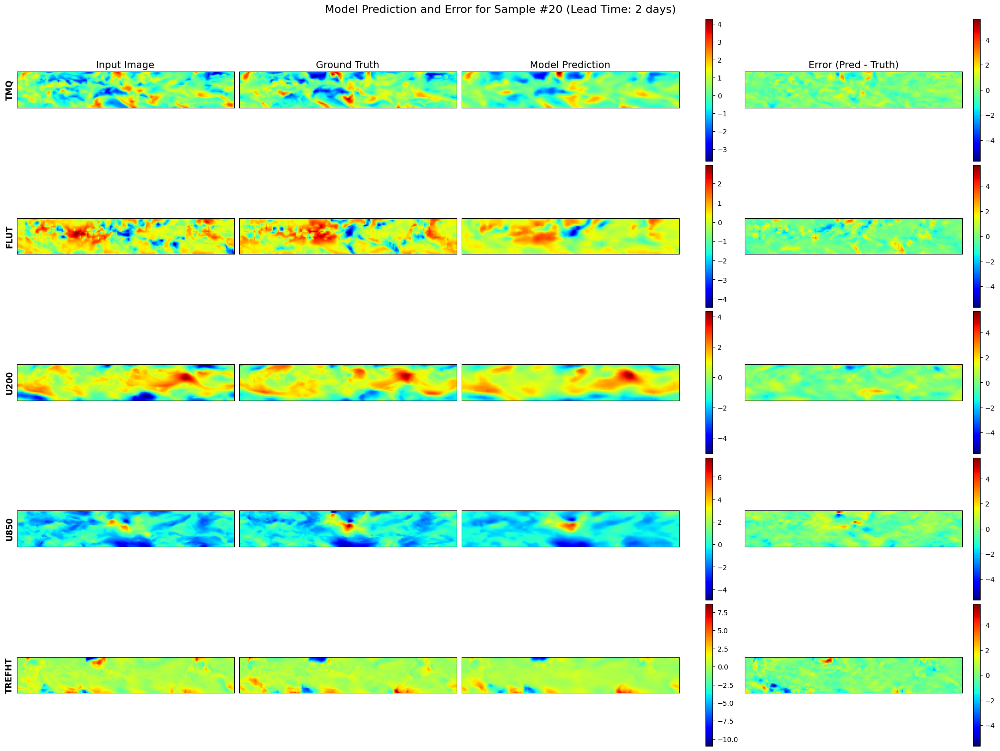

In [74]:
obs_dataset = OBSDataset(obs_dir=obs_directory, time_dir=time_dir, lead_time=lead_time_width)

train_test_split = 0.95
total_samples = len(obs_dataset)
print(f"Total OBS samples across all lead times: {total_samples}")

obs_train_dataset, obs_test_dataset = torch.utils.data.random_split(obs_dataset, [int(train_test_split * total_samples), total_samples - int(train_test_split * total_samples)])

model_path = obs_out_dir + "ViTTIMJO_FiLM_Andrew_OBS_leadTmFullField2SmallNoCV_ensm1_round1.pth"

model_to_plot = torch.load(model_path, weights_only=False, map_location=torch.device('cpu')).to(device) 

plot_single_model_comparison(
    model=model_to_plot,
    dataset=obs_test_dataset,
    sample_idx=20,
)

Loading MDL dataset and processing independent runs...
MDL raw data loaded. 43076 total entries.
Found 8 independent runs in the file.
MDL dataset fully processed. Found 42364 valid input-target pairs across all runs.


FileNotFoundError: [Errno 2] No such file or directory: 'Images/100.png'

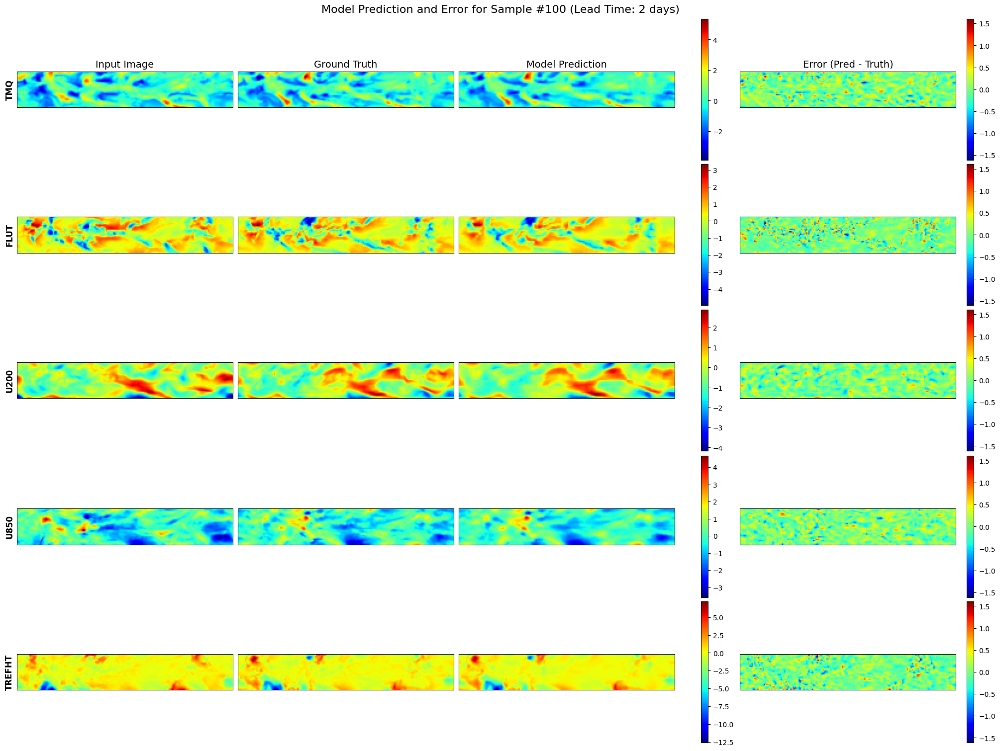

In [5]:
# Load dataset
mdl_dataset = MDLDataset(mdl_dir=mdl_directory, time_dir=time_dir, lead_time=lead_time_width)

# Split into training and testing sets
mdl_total_samples = len(mdl_dataset)
mdl_train_size = int(0.8 * mdl_total_samples) - int(0.8 * mdl_total_samples) % 121
mdl_test_size = mdl_total_samples - mdl_train_size
mdl_train_dataset, mdl_test_dataset = torch.utils.data.random_split(mdl_dataset, [mdl_train_size, mdl_test_size])

model_path = mdl_out_dir + "ViTTIMJO_FiLM_Andrew_MDL_leadTmFullField2NoCV_ensm1_last.pth"

model_to_plot = torch.load(model_path, weights_only=False, map_location=torch.device('cpu')).to(device)

Plot saved to: Images/100


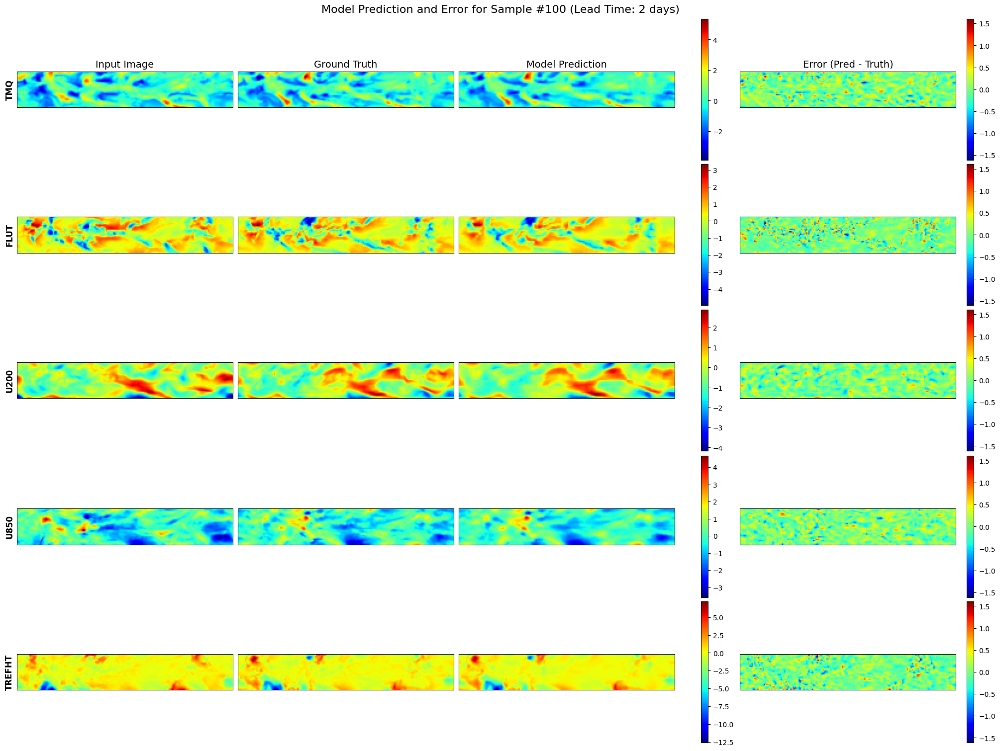

Plot saved to: Images/200


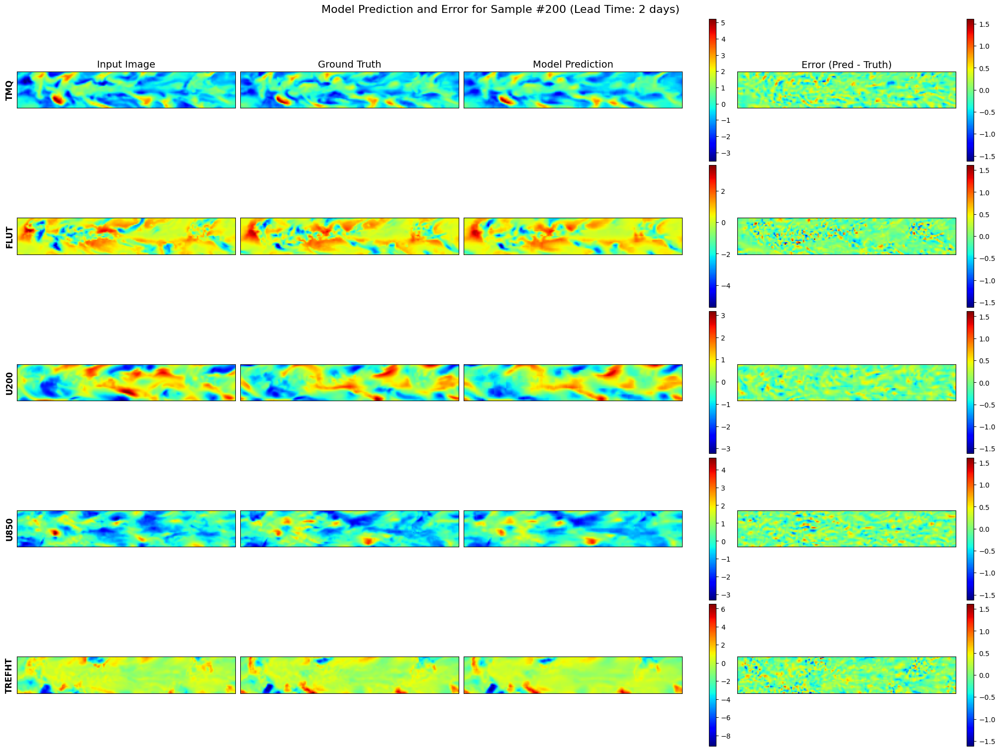

Plot saved to: Images/300


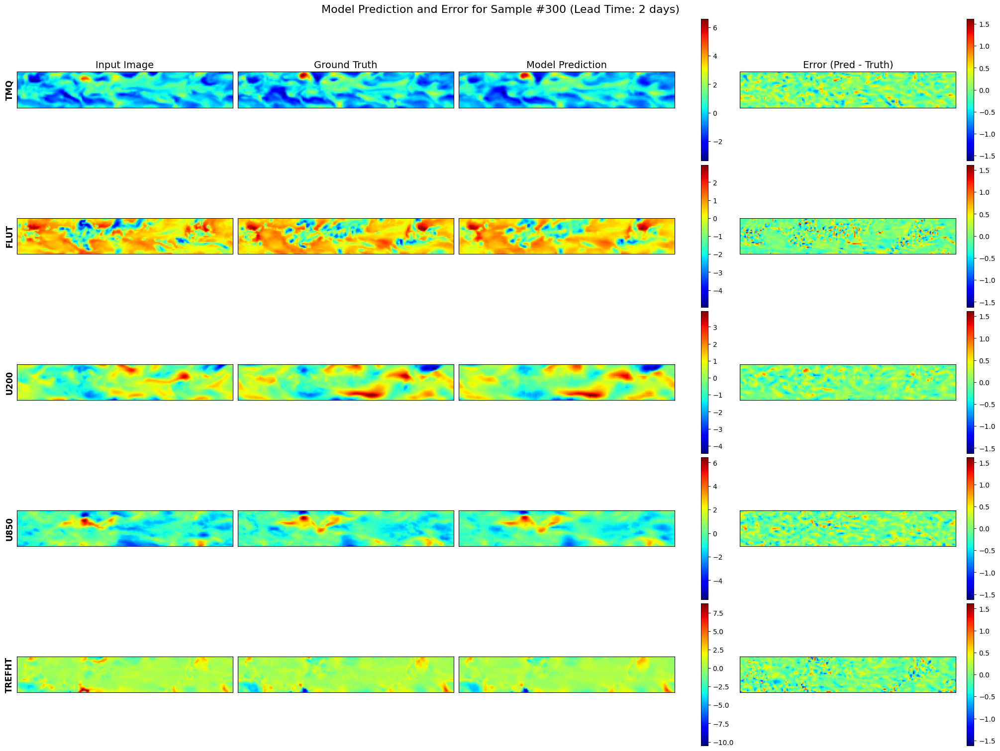

Plot saved to: Images/400


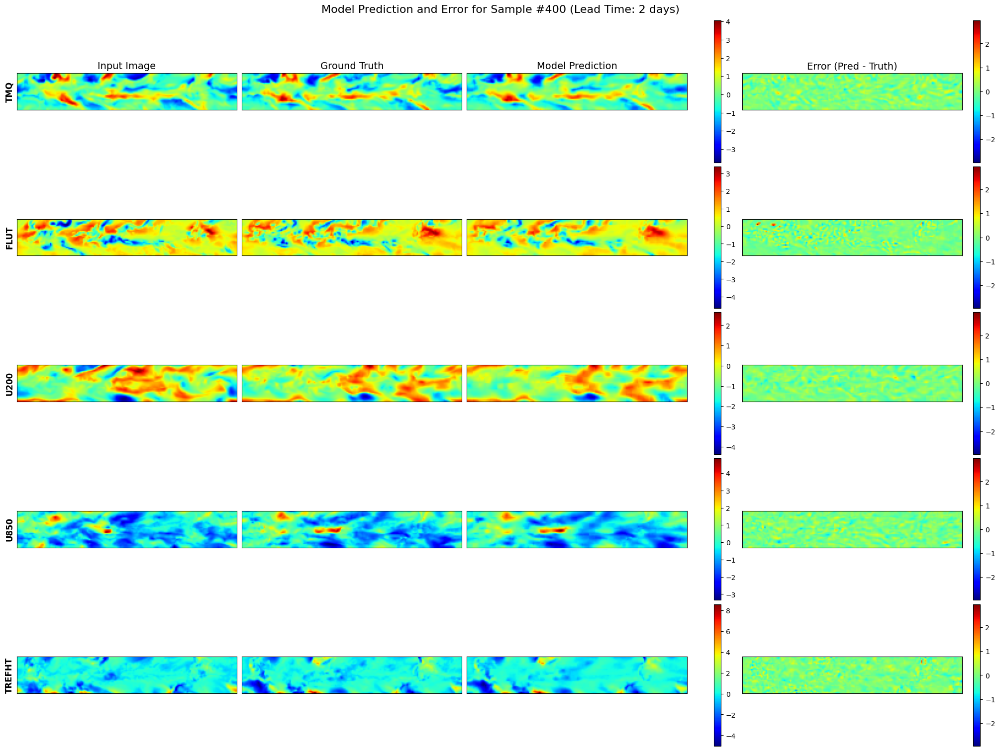

Plot saved to: Images/500


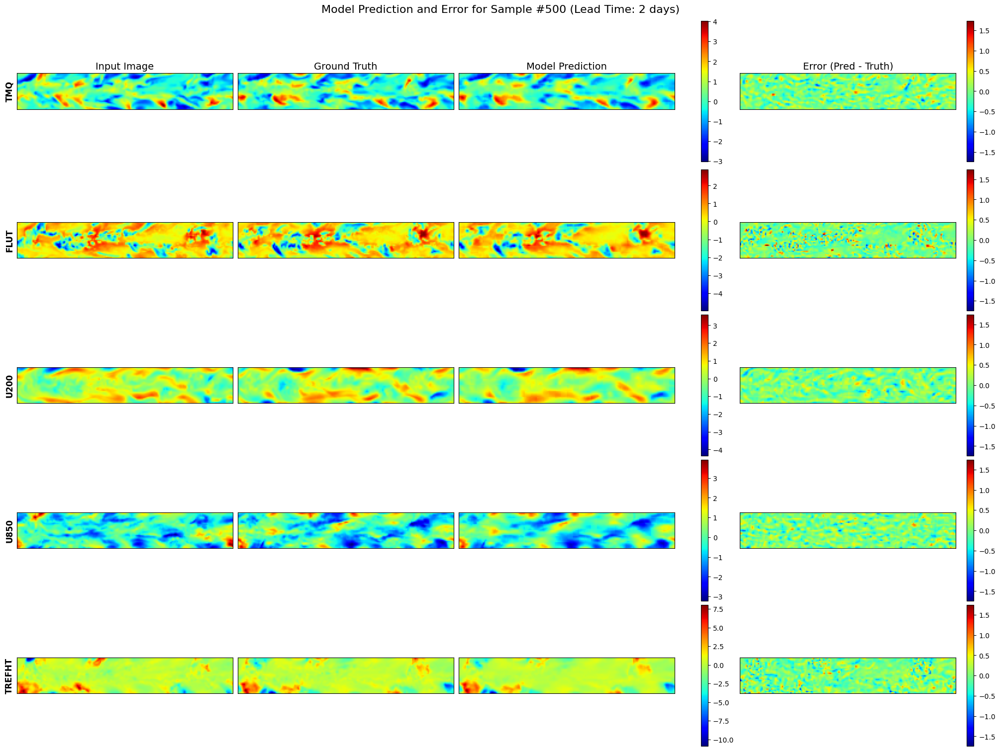

In [6]:
for idx in [100, 200, 300, 400, 500]:
    plot_single_model_comparison(
        model=model_to_plot,
        dataset=mdl_train_dataset,
        sample_idx=idx,
        save_path = f"Images/{idx}"
    )